In [149]:
import glob
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from os import path
import collections
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from scipy.stats import norm
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn import metrics
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import string
import re
import nltk
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.tokenize import WhitespaceTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer
import pandas as pd
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from datetime import *

In [17]:
cd excel

/Users/Jay/Desktop/university_new/CMU/2021 Spring/Data Science for Product Managers/PROJECT/excel


In [20]:
path = os.getcwd()
path

'/Users/Jay/Desktop/university_new/CMU/2021 Spring/Data Science for Product Managers/PROJECT/excel'

In [21]:
all_data = pd.DataFrame()

for f in glob.glob(path+"/*.xlsx"):
    df = pd.read_excel(f)
    all_data = all_data.append(df,ignore_index=True)

In [22]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 512711 entries, 0 to 512710
Data columns (total 41 columns):
Post ID                                   493173 non-null object
Sound Bite Text                           512700 non-null object
Ratings and Scores                        0 non-null float64
Title                                     303887 non-null object
Source Type                               493173 non-null object
Post Type                                 493173 non-null object
Media Type                                493173 non-null object
URL                                       493173 non-null object
Domain                                    493173 non-null object
Published Date (GMT-04:00) New York       512700 non-null object
Author Gender                             493173 non-null object
Author URL                                363291 non-null object
Author Name                               379871 non-null object
Author Handle                             206106

In [24]:
all_data_1 = all_data.drop_duplicates()
##512711 - 511268 =1443

In [25]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
all_data.head(3)

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating
0,https://cellphoneforums.net/onlineunlocks-com/...,Samsung Galaxy S8 G950U G950P Sprint unlock by...,NaN,Samsung Galaxy S8 G950U G950P Sprint unlock by...,Blogs,Original,No Media,https://cellphoneforums.net/onlineunlocks-com/...,cellphoneforums.net,"May 17, 2017 5:14:00 PM",Unknown,NaN,onlineunlocks,NaN,NaN,United States,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,14759701913167960370,"According to More, there are moreover circulat...",NaN,IOS 11 Update – Features And Updates leaked,Blogs,Original,Link,https://www.phonemantra.com/2017/05/ios-11-upd...,phonemantra.com,"May 9, 2017 3:31:31 AM",Unknown,https://www.phonemantra.com/,PhoneMantra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,13957544623200282820,After a monster reception for the iPhone 6 ser...,NaN,Apple’s latest China ad features a very differ...,Blogs,Original,No Media,https://www.qz.com/976503/apples-latest-china-...,qz.com,"May 5, 2017 12:07:43 AM",Unknown,https://www.qz.com/,Quartz,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,company,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
all_data_2 = all_data_1.dropna(axis=0, subset=['Post ID' , 'Sound Bite Text' , 'Published Date (GMT-04:00) New York' , 'No. of Followers/Daily Unique Visitors'])
all_data_2.info()
#492518

<class 'pandas.core.frame.DataFrame'>
Int64Index: 492518 entries, 0 to 512710
Data columns (total 41 columns):
Post ID                                   492518 non-null object
Sound Bite Text                           492518 non-null object
Ratings and Scores                        0 non-null float64
Title                                     303373 non-null object
Source Type                               492518 non-null object
Post Type                                 492518 non-null object
Media Type                                492518 non-null object
URL                                       492518 non-null object
Domain                                    492518 non-null object
Published Date (GMT-04:00) New York       492518 non-null object
Author Gender                             492518 non-null object
Author URL                                363147 non-null object
Author Name                               379286 non-null object
Author Handle                             206072

In [27]:
all_data_2.isnull().sum()

Post ID                                        0
Sound Bite Text                                0
Ratings and Scores                        492518
Title                                     189145
Source Type                                    0
Post Type                                      0
Media Type                                     0
URL                                            0
Domain                                         0
Published Date (GMT-04:00) New York            0
Author Gender                                  0
Author URL                                129371
Author Name                               113232
Author Handle                             286446
Author ID                                 286801
Author Location - Country 1               315659
Author Location - State/Province 1        453626
Author Location - City 1                  459038
Author Location - Country 2               492110
Author Location - State/Province 2        492167
Author Location - Ci

In [28]:
all_data_3= all_data_2[all_data_2['Post Type'] == 'Original']
all_data_3.info()
## 492518 to 409755

<class 'pandas.core.frame.DataFrame'>
Int64Index: 409755 entries, 0 to 512708
Data columns (total 41 columns):
Post ID                                   409755 non-null object
Sound Bite Text                           409755 non-null object
Ratings and Scores                        0 non-null float64
Title                                     283656 non-null object
Source Type                               409755 non-null object
Post Type                                 409755 non-null object
Media Type                                409755 non-null object
URL                                       409755 non-null object
Domain                                    409755 non-null object
Published Date (GMT-04:00) New York       409755 non-null object
Author Gender                             409755 non-null object
Author URL                                281703 non-null object
Author Name                               298798 non-null object
Author Handle                             183940

In [29]:
all_data_4= all_data_3[all_data_3['Sound Bite Text'] != 'Post deleted by the author.']
all_data_4.info()
#409755 to 409755

<class 'pandas.core.frame.DataFrame'>
Int64Index: 409755 entries, 0 to 512708
Data columns (total 41 columns):
Post ID                                   409755 non-null object
Sound Bite Text                           409755 non-null object
Ratings and Scores                        0 non-null float64
Title                                     283656 non-null object
Source Type                               409755 non-null object
Post Type                                 409755 non-null object
Media Type                                409755 non-null object
URL                                       409755 non-null object
Domain                                    409755 non-null object
Published Date (GMT-04:00) New York       409755 non-null object
Author Gender                             409755 non-null object
Author URL                                281703 non-null object
Author Name                               298798 non-null object
Author Handle                             183940

In [30]:
all_data_4['No. of Followers/Daily Unique Visitors'].describe()

count    4.097550e+05
mean     4.089722e+04
std      9.111978e+05
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      1.277749e+08
Name: No. of Followers/Daily Unique Visitors, dtype: float64

/anaconda3/lib/python3.6/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


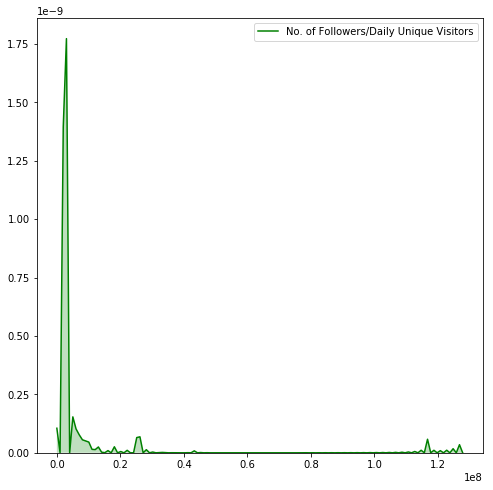

In [31]:
plt.figure(figsize = (8,8 ))
sns.kdeplot(all_data_4['No. of Followers/Daily Unique Visitors'], color="green", shade=True)
plt.show()

In [32]:
values = []
for a in range(0,99) :
    #print(a,"th quantile value :" , all_data_4['No. of Followers/Daily Unique Visitors'].quantile(a/100))
    values.append(all_data_4['No. of Followers/Daily Unique Visitors'].quantile(a/100))
print(values) 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 26.0, 96.0, 226.0, 420.0, 760.0, 1392.0, 3016.0, 9688.0, 44330.0, 157039.0, 531195.0]


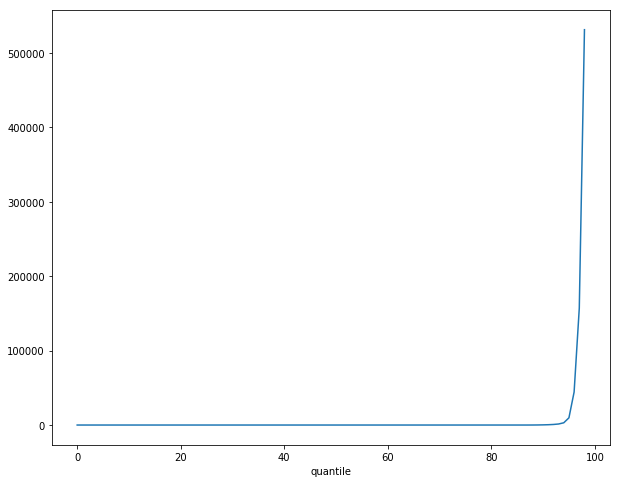

In [33]:
plt.figure(figsize=(10,8))
plt.plot(values)
plt.xlabel('quantile')
plt.show()

In [34]:
qcap = all_data_4['No. of Followers/Daily Unique Visitors'].quantile(0.95)
qcap


9688.0

In [35]:
all_data_4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 409755 entries, 0 to 512708
Data columns (total 41 columns):
Post ID                                   409755 non-null object
Sound Bite Text                           409755 non-null object
Ratings and Scores                        0 non-null float64
Title                                     283656 non-null object
Source Type                               409755 non-null object
Post Type                                 409755 non-null object
Media Type                                409755 non-null object
URL                                       409755 non-null object
Domain                                    409755 non-null object
Published Date (GMT-04:00) New York       409755 non-null object
Author Gender                             409755 non-null object
Author URL                                281703 non-null object
Author Name                               298798 non-null object
Author Handle                             183940

In [36]:
all_data_5 = all_data_4.loc[all_data_4['No. of Followers/Daily Unique Visitors'] < qcap]
all_data_5.info()
#409755 to 389185

<class 'pandas.core.frame.DataFrame'>
Int64Index: 389185 entries, 0 to 512705
Data columns (total 41 columns):
Post ID                                   389185 non-null object
Sound Bite Text                           389185 non-null object
Ratings and Scores                        0 non-null float64
Title                                     273067 non-null object
Source Type                               389185 non-null object
Post Type                                 389185 non-null object
Media Type                                389185 non-null object
URL                                       389185 non-null object
Domain                                    389185 non-null object
Published Date (GMT-04:00) New York       389185 non-null object
Author Gender                             389185 non-null object
Author URL                                273113 non-null object
Author Name                               283841 non-null object
Author Handle                             178445

In [37]:
values = []
for a in range(0,100) :
    #print(a,"th quantile value :" , all_data_4['No. of Followers/Daily Unique Visitors'].quantile(a/100))
    values.append(all_data_5['No. of Followers/Daily Unique Visitors'].quantile(a/100))
print(values) 

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 3.0, 45.0, 131.0, 261.0, 470.0, 817.0, 1462.0, 3109.319999999949]


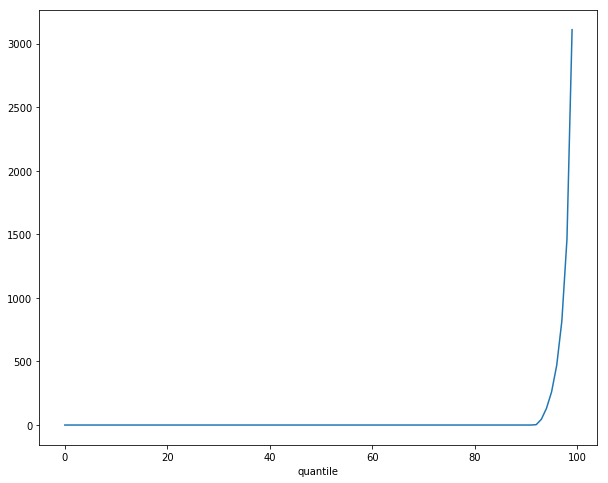

In [38]:
plt.figure(figsize=(10,8))
plt.plot(values)
plt.xlabel('quantile')
plt.show()

In [39]:
all_data_5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 389185 entries, 0 to 512705
Data columns (total 41 columns):
Post ID                                   389185 non-null object
Sound Bite Text                           389185 non-null object
Ratings and Scores                        0 non-null float64
Title                                     273067 non-null object
Source Type                               389185 non-null object
Post Type                                 389185 non-null object
Media Type                                389185 non-null object
URL                                       389185 non-null object
Domain                                    389185 non-null object
Published Date (GMT-04:00) New York       389185 non-null object
Author Gender                             389185 non-null object
Author URL                                273113 non-null object
Author Name                               283841 non-null object
Author Handle                             178445

In [40]:
q95 = all_data_5['No. of Followers/Daily Unique Visitors'].quantile(0.95)
q95

261.0

In [41]:
all_data_6 = all_data_5[all_data_5['No. of Followers/Daily Unique Visitors'] < q95]
all_data_6['Type'] = 'Normal'
professional_df = all_data_5[all_data_5['No. of Followers/Daily Unique Visitors'] >= q95]
professional_df['Type'] = 'Professional'

temp = [all_data_6 , professional_df]
all_data_7 = pd.concat(temp)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [42]:
all_data_7.groupby(['Type']).count()

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating
Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Normal,369719,369719,0,272861,369719,369719,369719,369719,369719,369719,369719,253834,266895,159231,145462,116421,15574,14608,35,28,24,3,369719,1027,1880,80474,36391,369719,0,83,83,83,39888,22709,39053,32,0,0,11388,0,2116
Professional,19466,19466,0,206,19466,19466,19466,19466,19466,19466,19466,19279,16946,19214,16885,10423,8089,6764,114,100,93,17,19466,3077,5119,3961,1741,19466,0,189,189,189,3844,2539,3839,13,0,0,0,0,0


In [43]:
normal_df=all_data_6

In [44]:
normal_df['Published Date (GMT-04:00) New York']= pd.to_datetime\
(normal_df['Published Date (GMT-04:00) New York']).dt.date

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [45]:
normal_df.sort_values(inplace=True,ascending=True,by='Published Date (GMT-04:00) New York')

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [46]:
normal_df.drop(normal_df[normal_df["Author Name"].str.contains("News|news",na=False)].index, inplace = True) 

/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [47]:
normal_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 354949 entries, 488945 to 382423
Data columns (total 42 columns):
Post ID                                   354949 non-null object
Sound Bite Text                           354949 non-null object
Ratings and Scores                        0 non-null float64
Title                                     259316 non-null object
Source Type                               354949 non-null object
Post Type                                 354949 non-null object
Media Type                                354949 non-null object
URL                                       354949 non-null object
Domain                                    354949 non-null object
Published Date (GMT-04:00) New York       354949 non-null object
Author Gender                             354949 non-null object
Author URL                                241877 non-null object
Author Name                               252125 non-null object
Author Handle                             1

In [48]:
df_iphone_8 = normal_df[(normal_df['Sound Bite Text'].str.contains('iPhone 8')) | (normal_df['Sound Bite Text'].str.contains('iphone 8'))]
df_iphone_8 = df_iphone_8[  (~df_iphone_8['Sound Bite Text'].str.contains('Galaxy S8')) & (~df_iphone_8['Sound Bite Text'].str.contains('iphone X'))
                       & (~df_iphone_8['Sound Bite Text'].str.contains('iPhone X'))]
df_iphone_8.info()
df_iphone_8.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119232 entries, 488945 to 385228
Data columns (total 42 columns):
Post ID                                   119232 non-null object
Sound Bite Text                           119232 non-null object
Ratings and Scores                        0 non-null float64
Title                                     80653 non-null object
Source Type                               119232 non-null object
Post Type                                 119232 non-null object
Media Type                                119232 non-null object
URL                                       119232 non-null object
Domain                                    119232 non-null object
Published Date (GMT-04:00) New York       119232 non-null object
Author Gender                             119232 non-null object
Author URL                                80515 non-null object
Author Name                               82987 non-null object
Author Handle                             5717

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating,Type
488945,8.36913e+17,iPhone 8 to use USB-C? Xbox to subscription ga...,NaN,NaN,Twitter,Original,Link,http://twitter.com/WorldTechMag/statuses/83691...,twitter.com,2017-03-01,Unknown,https://twitter.com/WorldTechMag,WorldTechMag,WorldTechMag,8.18934e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,Music,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
463621,8.37098e+17,I liked a @YouTube video youtu.be/yf_CyfT1c0s?...,NaN,NaN,Twitter,Original,Link,http://twitter.com/Gizmotech13/statuses/837097...,twitter.com,2017-03-01,Male,https://twitter.com/Gizmotech13,Edward.W.S.McCarthy,Gizmotech13,7.61581e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,@YouTube video iPhone 8,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
476812,8.36858e+17,Are you more excited for iPhone 8 or S8? #Bolo...,NaN,NaN,Twitter,Original,No Media,http://twitter.com/VivekSoni26/statuses/836857...,twitter.com,2017-03-01,Male,https://twitter.com/VivekSoni26,Vivek Soni,VivekSoni26,3.59975e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,49.0,Student,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
479252,8.37083e+17,Sviđa mi se videozapis youtu.be/yf_CyfT1c0s?a ...,NaN,NaN,Twitter,Original,Link,http://twitter.com/baricgordan/statuses/837082...,twitter.com,2017-03-01,Unknown,https://twitter.com/baricgordan,Gordan Baric,baricgordan,6.08946e+08,Croatia,NaN,Zagreb,NaN,NaN,NaN,NaN,35.0,NaN,NaN,iPhone 8,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
451541,8.36905e+17,Another small teaser (A) iPhone 8 #iPhone8 #iP...,NaN,NaN,Twitter,Original,Image,http://twitter.com/CConceptCreator/statuses/83...,twitter.com,2017-03-01,Unknown,https://twitter.com/CConceptCreator,Concepts-Creator,CConceptCreator,7.96452e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,148.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal


In [49]:
df_iphone_X = normal_df[(normal_df['Sound Bite Text'].str.contains('iPhone X')) | (normal_df['Sound Bite Text'].str.contains('iphone X'))
                       | (normal_df['Sound Bite Text'].str.contains('iPhone 10')) | (normal_df['Sound Bite Text'].str.contains('iphone 10'))]
df_iphone_X = df_iphone_X[(~df_iphone_X['Sound Bite Text'].str.contains('iPhone 8'))]
df_iphone_X = df_iphone_X[(~df_iphone_X['Sound Bite Text'].str.contains('Galaxy'))]
df_iphone_X.info()
df_iphone_X.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 728 entries, 108489 to 385631
Data columns (total 42 columns):
Post ID                                   728 non-null object
Sound Bite Text                           728 non-null object
Ratings and Scores                        0 non-null float64
Title                                     412 non-null object
Source Type                               728 non-null object
Post Type                                 728 non-null object
Media Type                                728 non-null object
URL                                       728 non-null object
Domain                                    728 non-null object
Published Date (GMT-04:00) New York       728 non-null object
Author Gender                             728 non-null object
Author URL                                486 non-null object
Author Name                               524 non-null object
Author Handle                             361 non-null object
Author ID           

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating,Type
108489,post_158960954163_341447938,•\nLast but not least tutu helper is totally i...,NaN,"Tutu Helper Download Tutu Helper (APK) for PC,...",Tumblr,Original,Link,https://tumblr.com/ZwmQFe2K2pwip,tumblr.com,2017-03-29,Unknown,http://tutuapp993.tumblr.com,NaN,tutuapp993,341447938,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
157641,13714565722989225190,"Also, instead of being overly (and unrealistic...",NaN,What if the next iPhone was also a throwback t...,Blogs,Original,Link,https://mdsekendarali.wordpress.com/2017/04/07...,mdsekendarali.wordpress.com,2017-04-07,Unknown,https://mdsekendarali.wordpress.com/,Md. Sekendar Ali,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,"Hajek's imagined iPhone X, it",NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
157670,810007297235845612,"Also, instead of being overly (and unrealistic...",NaN,What if the next iPhone was also a throwback t...,Blogs,Original,No Media,http://www.finance-radar.com/what-if-the-next-...,finance-radar.com,2017-04-07,Unknown,http://www.finance-radar.com/,Finance Radar,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,"Hajek's imagined iPhone X, it",NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
148068,16963539324906467474,"Also, instead of being overly (and unrealistic...",NaN,What if the next iPhone was also a throwback t...,Blogs,Original,No Media,http://evalori2.blogspot.com/2017/04/what-if-n...,evalori2.blogspot.com,2017-04-07,Female,http://evalori2.blogspot.com/,Eva Lori,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,"Hajek's imagined iPhone X, it",NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
148126,post_159294643084_19203644,"Also, instead of being overly (and unrealistic...",NaN,What if the next iPhone was also a throwback t...,Tumblr,Original,Link,https://tumblr.com/Z0ihSx2KMirkC,tumblr.com,2017-04-07,Unknown,http://graphicwheeler.tumblr.com,NaN,graphicwheeler,19203644,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,"Hajek's imagined iPhone X, it",NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal


In [50]:
df_galaxy = normal_df[(normal_df['Sound Bite Text'].str.contains('Galaxy')) | (normal_df['Sound Bite Text'].str.contains('galaxy'))]
df_galaxy = df_galaxy[(~df_galaxy['Sound Bite Text'].str.contains('iPhone'))]
df_galaxy = df_galaxy[(~df_galaxy['Sound Bite Text'].str.contains('iphone'))]
df_galaxy.info()
df_galaxy.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 160923 entries, 451903 to 391880
Data columns (total 42 columns):
Post ID                                   160923 non-null object
Sound Bite Text                           160923 non-null object
Ratings and Scores                        0 non-null float64
Title                                     118451 non-null object
Source Type                               160923 non-null object
Post Type                                 160923 non-null object
Media Type                                160923 non-null object
URL                                       160923 non-null object
Domain                                    160923 non-null object
Published Date (GMT-04:00) New York       160923 non-null object
Author Gender                             160923 non-null object
Author URL                                112548 non-null object
Author Name                               115151 non-null object
Author Handle                             6

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating,Type
451903,8.37008e+17,"No more renders or blurry shots, this Galaxy S...",NaN,NaN,Twitter,Original,Image; Link,http://twitter.com/vtodoandroid/statuses/83700...,twitter.com,2017-03-01,Unknown,https://twitter.com/vtodoandroid,Todo Android,vtodoandroid,4.83413e+08,Spain,NaN,NaN,NaN,NaN,NaN,NaN,28.0,NaN,NaN,"Galaxy S8, leak",NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
470184,8.36878e+17,"New post: ""New post: ""This is the Samsung Gala...",NaN,NaN,Twitter,Original,Link,http://twitter.com/Blogserver/statuses/8368783...,twitter.com,2017-03-01,Unknown,https://twitter.com/Blogserver,Blog Server,Blogserver,2.84965e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,NaN,1.0,NaN,"New post: ""This is the Samsung Galaxy S8 https...",Blog Server,Blogserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
489032,8.37055e+17,mashable: We finally know what the Galaxy S8 l...,NaN,NaN,Twitter,Original,Link,http://twitter.com/Shop_OwnerMark/statuses/837...,twitter.com,2017-03-01,Unknown,https://twitter.com/Shop_OwnerMark,Jerem Owen,Shop_OwnerMark,3.02991e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,169.0,Sales and Marketing,NaN,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
454866,8.37027e+17,I liked a @YouTube video youtu.be/Q0X9LgMJl1E?...,NaN,NaN,Twitter,Original,Link,http://twitter.com/ELiTEG4M3R3/statuses/837027...,twitter.com,2017-03-01,Unknown,https://twitter.com/ELiTEG4M3R3,Shard,ELiTEG4M3R3,7.60997e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,90.0,NaN,NaN,@YouTube video Samsung Galaxy,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
454908,8.3699e+17,EXCLUSIVE: This is the Galaxy S8 dlvr.it/NWDDc...,NaN,NaN,Twitter,Original,Image; Link,http://twitter.com/AuthcomInc/statuses/8369897...,twitter.com,2017-03-01,Unknown,https://twitter.com/AuthcomInc,Authcom Industries,AuthcomInc,2.35515e+09,Canada,Nova Scotia,NaN,NaN,NaN,NaN,NaN,57.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal


In [146]:
df_both = normal_df[(normal_df['Sound Bite Text'].str.contains('Galaxy')) | (normal_df['Sound Bite Text'].str.contains('galaxy')) |
                   (normal_df['Sound Bite Text'].str.contains('iphone')) | (normal_df['Sound Bite Text'].str.contains('iPhone'))]
df_both.info()
df_both.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 348735 entries, 488945 to 382423
Data columns (total 42 columns):
Post ID                                   348735 non-null object
Sound Bite Text                           348735 non-null object
Ratings and Scores                        0 non-null float64
Title                                     256407 non-null object
Source Type                               348735 non-null object
Post Type                                 348735 non-null object
Media Type                                348735 non-null object
URL                                       348735 non-null object
Domain                                    348735 non-null object
Published Date (GMT-04:00) New York       348735 non-null object
Author Gender                             348735 non-null object
Author URL                                237393 non-null object
Author Name                               247250 non-null object
Author Handle                             1

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating,Type
488945,8.36913e+17,iPhone 8 to use USB-C? Xbox to subscription ga...,NaN,NaN,Twitter,Original,Link,http://twitter.com/WorldTechMag/statuses/83691...,twitter.com,2017-03-01,Unknown,https://twitter.com/WorldTechMag,WorldTechMag,WorldTechMag,8.18934e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,Music,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
451913,8.36912e+17,Samsung Galaxy S8 leaks preview the kind of fo...,NaN,NaN,Twitter,Original,Link,http://twitter.com/eatapplen1/statuses/8369119...,twitter.com,2017-03-01,Unknown,https://twitter.com/eatapplen1,100% APPLE,eatapplen1,7.61123e+17,France,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
451903,8.37008e+17,"No more renders or blurry shots, this Galaxy S...",NaN,NaN,Twitter,Original,Image; Link,http://twitter.com/vtodoandroid/statuses/83700...,twitter.com,2017-03-01,Unknown,https://twitter.com/vtodoandroid,Todo Android,vtodoandroid,4.83413e+08,Spain,NaN,NaN,NaN,NaN,NaN,NaN,28.0,NaN,NaN,"Galaxy S8, leak",NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
463621,8.37098e+17,I liked a @YouTube video youtu.be/yf_CyfT1c0s?...,NaN,NaN,Twitter,Original,Link,http://twitter.com/Gizmotech13/statuses/837097...,twitter.com,2017-03-01,Male,https://twitter.com/Gizmotech13,Edward.W.S.McCarthy,Gizmotech13,7.61581e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,NaN,NaN,@YouTube video iPhone 8,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal
470184,8.36878e+17,"New post: ""New post: ""This is the Samsung Gala...",NaN,NaN,Twitter,Original,Link,http://twitter.com/Blogserver/statuses/8368783...,twitter.com,2017-03-01,Unknown,https://twitter.com/Blogserver,Blog Server,Blogserver,2.84965e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.0,NaN,NaN,NaN,NaN,1.0,NaN,"New post: ""This is the Samsung Galaxy S8 https...",Blog Server,Blogserver,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal


In [151]:
df_before = df_iphone_8[df_iphone_8['Published Date (GMT-04:00) New York'] < date(2017, 9, 22)]
df_after = df_iphone_8[df_iphone_8['Published Date (GMT-04:00) New York'] >= date(2017, 9, 22)]
df_before['Before/After'] = "Before"
df_after["Before/After"] = "After"
temp = [df_before , df_after]
df_iphone_8 = pd.concat(temp)
df_iphone_8.info()


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


<class 'pandas.core.frame.DataFrame'>
Int64Index: 119232 entries, 488945 to 385228
Data columns (total 43 columns):
Post ID                                   119232 non-null object
Sound Bite Text                           119232 non-null object
Ratings and Scores                        0 non-null float64
Title                                     80653 non-null object
Source Type                               119232 non-null object
Post Type                                 119232 non-null object
Media Type                                119232 non-null object
URL                                       119232 non-null object
Domain                                    119232 non-null object
Published Date (GMT-04:00) New York       119232 non-null object
Author Gender                             119232 non-null object
Author URL                                80515 non-null object
Author Name                               82987 non-null object
Author Handle                             5717

In [152]:
df_before = df_iphone_X[df_iphone_X['Published Date (GMT-04:00) New York'] < date(2017, 9, 22)]
df_after = df_iphone_X[df_iphone_X['Published Date (GMT-04:00) New York'] >= date(2017, 9, 22)]
df_before['Before/After'] = "Before"
df_after["Before/After"] = "After"
temp = [df_before , df_after]
df_iphone_X = pd.concat(temp)
df_iphone_X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 728 entries, 108489 to 385631
Data columns (total 43 columns):
Post ID                                   728 non-null object
Sound Bite Text                           728 non-null object
Ratings and Scores                        0 non-null float64
Title                                     412 non-null object
Source Type                               728 non-null object
Post Type                                 728 non-null object
Media Type                                728 non-null object
URL                                       728 non-null object
Domain                                    728 non-null object
Published Date (GMT-04:00) New York       728 non-null object
Author Gender                             728 non-null object
Author URL                                486 non-null object
Author Name                               524 non-null object
Author Handle                             361 non-null object
Author ID           

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [153]:
df_before = df_galaxy[df_galaxy['Published Date (GMT-04:00) New York'] < date(2017, 3, 29)]
df_after = df_galaxy[df_galaxy['Published Date (GMT-04:00) New York'] >= date(2017, 3, 29)]
df_before['Before/After'] = "Before"
df_after["Before/After"] = "After"
temp = [df_before , df_after]
df_galaxy = pd.concat(temp)
df_galaxy.info()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


<class 'pandas.core.frame.DataFrame'>
Int64Index: 160923 entries, 451903 to 391880
Data columns (total 43 columns):
Post ID                                   160923 non-null object
Sound Bite Text                           160923 non-null object
Ratings and Scores                        0 non-null float64
Title                                     118451 non-null object
Source Type                               160923 non-null object
Post Type                                 160923 non-null object
Media Type                                160923 non-null object
URL                                       160923 non-null object
Domain                                    160923 non-null object
Published Date (GMT-04:00) New York       160923 non-null object
Author Gender                             160923 non-null object
Author URL                                112548 non-null object
Author Name                               115151 non-null object
Author Handle                             6

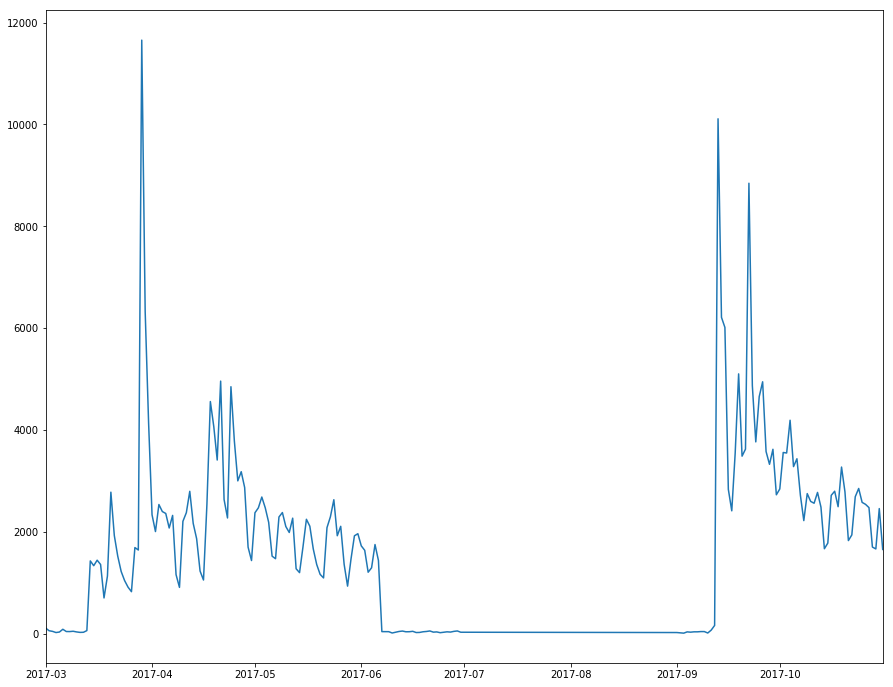

In [31]:
s = normal_df['Published Date (GMT-04:00) New York'].value_counts()
plt.figure(figsize=(15,12))
s.plot()

In [77]:
soundbite_list = normal_df['Sound Bite Text'].tolist()

In [78]:
#lowercase words as they are tokenized

In [79]:
review_lower = [tok.lower() for i in soundbite_list for tok in nltk.word_tokenize(i)]
print(len(review_lower))
print(review_lower[:10])

42974066
['iphone', '8', 'to', 'use', 'usb-c', '?', 'xbox', 'to', 'subscription', 'gaming']


In [80]:
#stopwords removal

In [81]:
nltk_stopwords = set(stopwords.words('english'))

In [82]:
review_lower_stop = [x for x in review_lower if not x in nltk_stopwords]
print(len(review_lower_stop))
print(review_lower_stop[:30])

28707929
['iphone', '8', 'use', 'usb-c', '?', 'xbox', 'subscription', 'gaming', '(', 'video', ')', 'ift.tt/2lsz82s', 'samsung', 'galaxy', 's8', 'leaks', 'preview', 'kind', 'form', 'factor', '’', 'expecting', 'iphone', '8', 'goo.gl/fb/wkvny6', 'renders', 'blurry', 'shots', ',', 'galaxy']


In [83]:
## remove non-alphabetic characters ( ex) punctations)

In [84]:
# function that takes a word and returns true if it consists only
#   of non-alphabetic characters
def alpha_filter(w):
    pattern = re.compile('^[^a-z]+$')
    if (pattern.match(w)):
        return True
    else:
        return False

In [85]:
# remove punctuations
review_lower_stop_pun = [y for y in review_lower_stop if not alpha_filter(y)]
print(len(review_lower_stop_pun))
print(review_lower_stop_pun[:30])

21422541
['iphone', 'use', 'usb-c', 'xbox', 'subscription', 'gaming', 'video', 'ift.tt/2lsz82s', 'samsung', 'galaxy', 's8', 'leaks', 'preview', 'kind', 'form', 'factor', 'expecting', 'iphone', 'goo.gl/fb/wkvny6', 'renders', 'blurry', 'shots', 'galaxy', 's8', 'leak', 'legit', 'gets', 'dlvr.it/nwfkc3', 'pic.twitter.com/extrxwdkq8', 'liked']


In [92]:
print("The top 100 most frequent words are below : ")
review_freq = nltk.FreqDist(review_lower_stop_pun_link)
review_freq_top = review_freq.most_common()
review_freq_top[:20]

The top 100 most frequent words are below : 


[('iphone', 667432),
 ('galaxy', 538273),
 ('s8', 446744),
 ('samsung', 412182),
 ('apple', 264745),
 ('new', 229063),
 ('plus', 197690),
 ("'s", 159893),
 ('phone', 156232),
 ('x', 116104),
 ('s8+', 97548),
 ('also', 92248),
 ('camera', 83687),
 ('one', 82590),
 ('screen', 80717),
 ('display', 77254),
 ('like', 74134),
 ('android', 70661),
 ('smartphone', 68777),
 ('first', 64245)]

In [ ]:
# let's look at tri-gram
from nltk.collocations import *
trigram_measures = nltk.collocations.TrigramAssocMeasures()


# convert original list into a list of bi-grams tokens
all_trigrams = list(nltk.trigrams(review_lower))
print(len(all_trigrams))

finder = TrigramCollocationFinder.from_words(review_lower)
# remove punctuations and other special characters
finder.apply_word_filter(alpha_filter)

# remove stopwords
finder.apply_word_filter(lambda w: w in nltk_stopwords)
all_trigrams = finder.score_ngrams(trigram_measures.raw_freq)
print(len(all_trigrams))

In [ ]:
all_trigrams[:30]

In [ ]:
from nltk.util import ngrams
five_gram = list(ngrams(review_lower_stop_pun, 5))
five_gram[:30]

In [45]:
## Textblob to see the sentiment, polarity

In [46]:
from textblob import TextBlob

In [47]:
normal_blob = pd.DataFrame(normal_df)

def detect_polarity(text):
    return TextBlob(text).sentiment.polarity

#def translate_english(text):
   # return TextBlob(text).translate(to='en')

#normal_blob['Sound Bite Translated'] = normal_df['Sound Bite Text'].apply(translate_english)

normal_blob['polarity'] = normal_df['Sound Bite Text'].apply(detect_polarity)

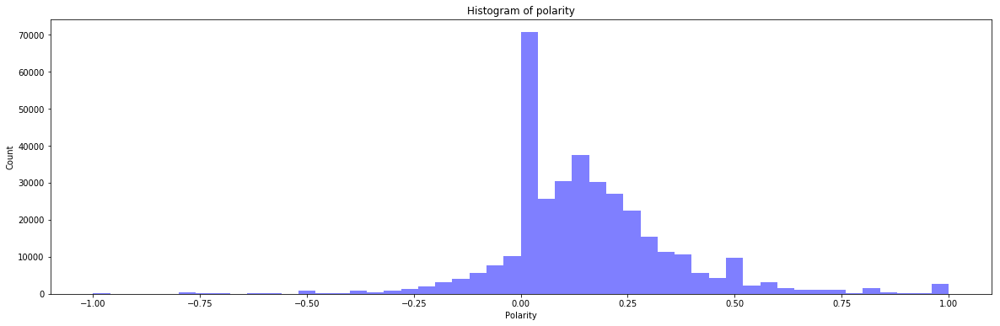

In [48]:
num_bins = 50
plt.figure(figsize=(20,6))
n, bins, patches = plt.hist(normal_blob.polarity, num_bins, facecolor='blue', alpha=0.5)
plt.xlabel('Polarity')
plt.ylabel('Count')
plt.title('Histogram of polarity')
plt.show()

In [49]:
normal_negative = normal_blob[normal_blob['polarity']<0]
normal_negative['Group'] = "Negative"

normal_positive = normal_blob[normal_blob['polarity']>0.1]
normal_positive['Group'] = "Positive"

normal_neutral = normal_blob[(normal_blob['polarity'] >=0) & (normal_blob['polarity']<0.1)]
normal_neutral['Group'] = "Netural"

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/s

In [50]:
normal_negative.head(5)

,Post ID,Sound Bite Text,Ratings and Scores,Title,Source Type,Post Type,Media Type,URL,Domain,Published Date (GMT-04:00) New York,Author Gender,Author URL,Author Name,Author Handle,Author ID,Author Location - Country 1,Author Location - State/Province 1,Author Location - City 1,Author Location - Country 2,Author Location - State/Province 2,Author Location - City 2,Author Location - Other,No. of Followers/Daily Unique Visitors,Professions,Interests,Positive Objects,Negative Objects,Richness,Tags,Quoted Post,Quoted Author Name,Quoted Author Handle,Total Engagements,Post Comments,Post Likes,Post Shares,Post Views,Post Dislikes,Product Name,Product Hierarchy,Rating,Type,polarity,Group
451903,8.37008e+17,"No more renders or blurry shots, this Galaxy S...",NaN,NaN,Twitter,Original,Image; Link,http://twitter.com/vtodoandroid/statuses/83700...,twitter.com,2017-03-01,Unknown,https://twitter.com/vtodoandroid,Todo Android,vtodoandroid,4.83413e+08,Spain,NaN,NaN,NaN,NaN,NaN,NaN,28.0,NaN,NaN,"Galaxy S8, leak",NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,-0.250,Negative
451541,8.36905e+17,Another small teaser (A) iPhone 8 #iPhone8 #iP...,NaN,NaN,Twitter,Original,Image,http://twitter.com/CConceptCreator/statuses/83...,twitter.com,2017-03-01,Unknown,https://twitter.com/CConceptCreator,Concepts-Creator,CConceptCreator,7.96452e+17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,148.0,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,-0.250,Negative
490513,8.37009e+17,"No more renders or blurry shots, this Galaxy S...",NaN,NaN,Twitter,Original,Link,http://twitter.com/androidisgod/statuses/83700...,twitter.com,2017-03-01,Unknown,https://twitter.com/androidisgod,Android,androidisgod,3.24749e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,141.0,NaN,NaN,"Galaxy S8, leak",NaN,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,-0.250,Negative
489012,8.36995e+17,The Supposed Leaked Galaxy S8 Photos Make The ...,NaN,NaN,Twitter,Original,No Media,http://twitter.com/AtomSamaniego/statuses/8369...,twitter.com,2017-03-01,Unknown,https://twitter.com/AtomSamaniego,??,AtomSamaniego,9.05501e+07,United States,Texas,Dallas,NaN,NaN,NaN,NaN,244.0,NaN,NaN,NaN,iPhone,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,-0.200,Negative
480983,8.37002e+17,The most shocking thing about WSJ's iPhone 8 r...,NaN,NaN,Twitter,Original,Link,http://twitter.com/kicqtr/statuses/83700162924...,twitter.com,2017-03-01,Unknown,https://twitter.com/kicqtr,kicqtr ????,kicqtr,3.68227e+08,Qatar,NaN,NaN,NaN,NaN,NaN,NaN,188.0,NaN,NaN,NaN,shocking thing,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,-0.125,Negative


In [51]:
grouping = [normal_negative,normal_positive,normal_neutral]
normal_groups = pd.concat(grouping)

In [52]:
import plotly.express as px
fig = px.line(normal_neutral, x='Published Date (GMT-04:00) New York', y='polarity')
fig.show()

In [132]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation, NMF

In [136]:
### NMF Topic Modeling

# The normalized corpus is then fed into a Term Frequency Vectorizer or Tf-idf vectorizer depending on the algorithm.
# Topic modeling is performed using NMF 

# Non-Negative Matrix Factorization (NMF): The goal of NMF is to find two non-negative matrices (W, H)
# whose product approximates the non-negative matrix X. 
# This factorization can be used for example for dimensionality reduction, source separation or topic extraction. 
#We will be using sklearn’s implementation of NMF.

In [316]:

def tfidf_nmf_function (dataframe, no_top_words, number) :
# Store only text contents
    data_text = dataframe[['Sound Bite Text']]
    data_text['index'] = dataframe.index
    # Assign to 'documents' which has texts and index of each
    documents = data_text
    ## Vectorization
    # NMF is able to use tf-idf - vectorize the corpus
    tfidf_vectorizer = TfidfVectorizer(max_df=0.9, min_df=10, max_features=1000000
                                   , stop_words='english', token_pattern = r'\b[^\d\W]+\b')
    # calculate the feature matrix
    tfidf = tfidf_vectorizer.fit_transform(dataframe['Sound Bite Text'])
    tfidf_feature_names = tfidf_vectorizer.get_feature_names()


    print ( "in the corpus of N documents, total of N unique features :")
    display(tfidf.shape)
    tfidf_feature_names = tfidf_vectorizer.get_feature_names()
    print("Length of unique features are : ", len(tfidf_vectorizer.get_feature_names()))

    # Run NMF   
    nmf = NMF(n_components=number, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd')
    nmf_z = nmf.fit_transform(tfidf)
        
    for topic_idx, topic in enumerate(nmf.components_):
            print("Topic %d:" % (topic_idx))
            print(", ".join([tfidf_feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
                       
    TopicNumber=[]
    for i in range(len(nmf_z)):
        h=nmf_z[i].tolist().index(nmf_z[i].max())
        TopicNumber.append(h)
    documents['topic_nmf']=TopicNumber
    sns.countplot(x='topic_nmf', data=documents)
   
 
    
def getTermsAndSizes(topic_display_list_item):
    terms = []
    sizes = []
    for term, size in topic_display_list_item:
        terms.append(term)
        sizes.append(size)
    return terms, sizes

In [317]:
#iphone X _ output 

in the corpus of N documents, total of N unique features :


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



(728, 355)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Length of unique features are :  355
Topic 0:
idr, eta, handcarry, chat, aluminum, store, info, apple, series, po
Topic 1:
apple, new, plus, s, iphonex, tags, ios, t, phone, buy
Topic 2:
grey, gold, silver, ready, jualanindo, di, akan, akhir, jualiphonex, iphonex


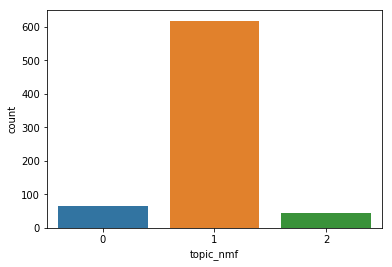

In [318]:
#def nmf_function (tfidf, model, feature_names, no_top_words) :
#nmf_function (tfidf,nmf, tfidf_feature_names, 20) 
#visualization topic distribution
tfidf_nmf_function(df_iphone_X,10 ,3)

In [319]:
#iphone_8 output 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



in the corpus of N documents, total of N unique features :


(119232, 16219)

Length of unique features are :  16219
Topic 0:
apple, s, new, phone, t, ios, design, year, display, like, camera, screen, news, charging
Topic 1:
https, twitter, com, t, tags, http, ifttt, tt, ift, pic, ly, zazzle, www, gwtucsonmall
Topic 2:
plus, apple, gold, unlocked, space, gray, smartphone, _, silver, buy, camera, new, free, portrait


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



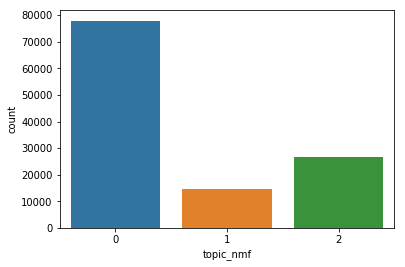

In [320]:
tfidf_nmf_function(df_iphone_8,14,3)

In [321]:
# galaxy output 

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



in the corpus of N documents, total of N unique features :


(160923, 19858)

Length of unique features are :  19858
Topic 0:
samsung, s, phone, new, plus, smartphone, screen, android, t, display, note, camera
Topic 1:
twitter, https, com, t, tags, http, ifttt, android, pic, rt, tech, martinguayott
Topic 2:
bixby, assistant, voice, button, s, samsung, launch, google, ai, virtual, siri, home


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



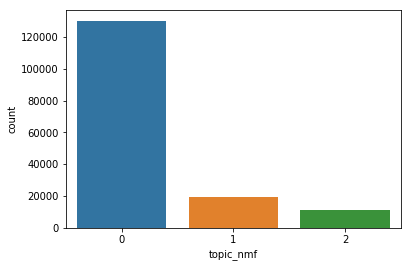

In [322]:
tfidf_nmf_function(df_galaxy,12,3)

In [ ]:
## Time Series - Moving average

In [273]:
from textblob import TextBlob

In [274]:
normal_blob = pd.DataFrame(df_galaxy)

def detect_polarity(text):
    return TextBlob(text).sentiment.polarity

#def translate_english(text):
   # return TextBlob(text).translate(to='en')

#normal_blob['Sound Bite Translated'] = normal_df['Sound Bite Text'].apply(translate_english)

normal_blob['polarity'] = df_galaxy['Sound Bite Text'].apply(detect_polarity)


normal_positive = normal_blob[normal_blob['polarity']>0.1]
normal_positive['Group'] = "Positive"


plotting_before = normal_positive.groupby(['Published Date (GMT-04:00) New York'])['polarity'].mean()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app


In [279]:
galaxy_timeseries = pd.DataFrame(plotting_before).reset_index()
galaxy_timeseries.head(3)

,Published Date (GMT-04:00) New York,polarity
0,2017-03-01,0.310536
1,2017-03-02,0.330682
2,2017-03-03,0.287879


In [280]:
galaxy_timeseries['MA'] = galaxy_timeseries['polarity'].rolling(window=5,center=False).mean()

In [328]:
new_num = (1 - (abs(galaxy_timeseries['polarity']- galaxy_timeseries['MA']))/ galaxy_timeseries['polarity']) * 100
galaxy_timeseries['accuracy'] = new_num
galaxy_timeseries

,Published Date (GMT-04:00) New York,polarity,MA,accuracy
0,2017-03-01,0.310536,NaN,NaN
1,2017-03-02,0.330682,NaN,NaN
2,2017-03-03,0.287879,NaN,NaN
3,2017-03-04,0.392172,NaN,NaN
4,2017-03-05,0.218182,0.307890,58.883775
5,2017-03-06,0.293944,0.304572,96.384429
6,2017-03-07,0.330556,0.304546,92.131668
7,2017-03-08,0.414744,0.329919,79.547777
8,2017-03-09,0.187205,0.288926,45.663608
9,2017-03-10,0.201515,0.285593,58.277303


In [341]:
galaxy_timeseries['accuracy'].mean()

88.62901684169555

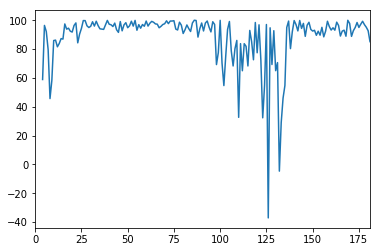

In [339]:
s = pd.Series(galaxy_timeseries['accuracy'])
s.plot.line() 


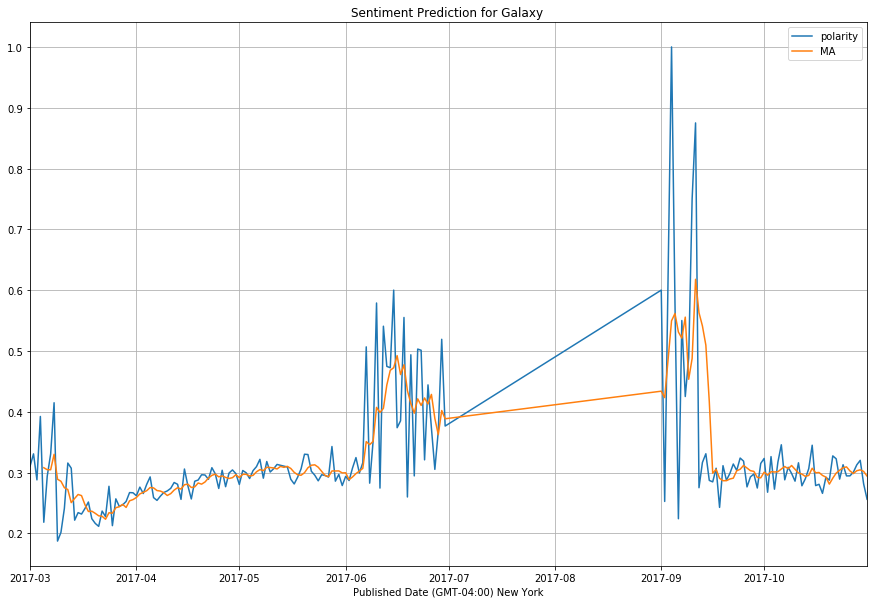

In [307]:
galaxy_timeseries.plot(x='Published Date (GMT-04:00) New York', \
                             y=['polarity', 'MA'], title= "Sentiment Prediction for Galaxy ", figsize=(15,10), grid=True)

In [308]:
normal_blob = pd.DataFrame(df_iphone_8)

def detect_polarity(text):
    return TextBlob(text).sentiment.polarity

#def translate_english(text):
   # return TextBlob(text).translate(to='en')

#normal_blob['Sound Bite Translated'] = normal_df['Sound Bite Text'].apply(translate_english)

normal_blob['polarity'] = df_iphone_8['Sound Bite Text'].apply(detect_polarity)


normal_positive = normal_blob[normal_blob['polarity']>0.1]
normal_positive['Group'] = "Positive"


plotting_before = normal_positive.groupby(['Published Date (GMT-04:00) New York'])['polarity'].mean()

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [309]:
iphone_timeseries = pd.DataFrame(plotting_before).reset_index()
iphone_timeseries.head(3)

,Published Date (GMT-04:00) New York,polarity
0,2017-03-01,0.486526
1,2017-03-02,0.347078
2,2017-03-03,0.554261


In [311]:
iphone_timeseries['MA'] = iphone_timeseries['polarity'].rolling(window=5,center=False).mean()

In [345]:
new_num = (1 - (abs(iphone_timeseries['polarity']- iphone_timeseries['MA']))/ iphone_timeseries['polarity']) * 100
iphone_timeseries['accuracy'] = new_num
iphone_timeseries

,Published Date (GMT-04:00) New York,polarity,MA,accuracy
0,2017-03-01,0.486526,NaN,NaN
1,2017-03-02,0.347078,NaN,NaN
2,2017-03-03,0.554261,NaN,NaN
3,2017-03-04,0.401768,NaN,NaN
4,2017-03-05,0.617045,0.481336,78.006519
5,2017-03-06,0.429545,0.469940,90.596078
6,2017-03-07,0.346970,0.469918,64.565138
7,2017-03-08,0.397112,0.438488,89.580700
8,2017-03-09,0.218182,0.401771,15.855035
9,2017-03-10,0.395806,0.357523,90.327774


In [346]:
iphone_timeseries['accuracy'].mean()

88.39556934263682

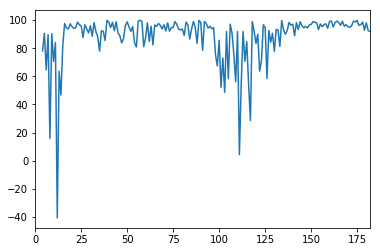

In [347]:
s = pd.Series(iphone_timeseries['accuracy'])
s.plot.line() 



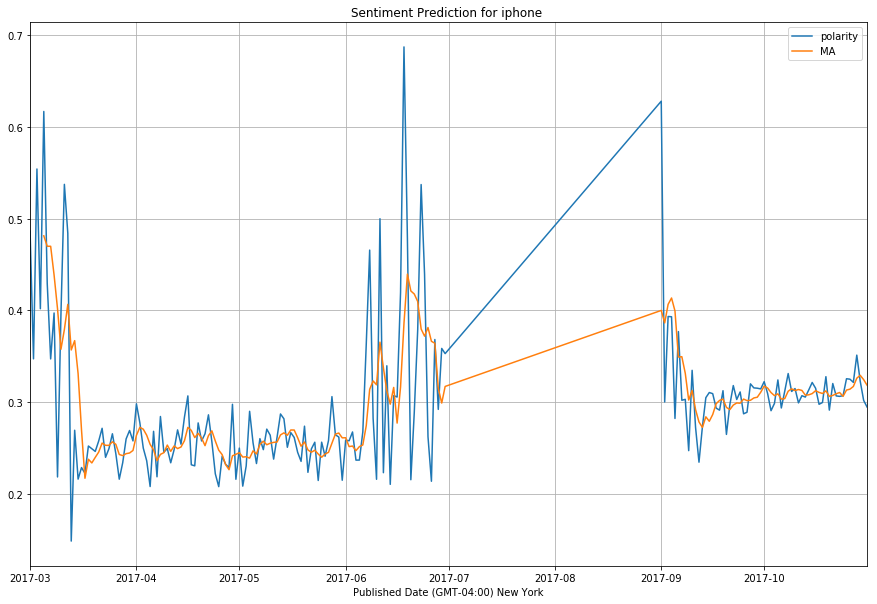

In [312]:
iphone_timeseries.plot(x='Published Date (GMT-04:00) New York', \
                             y=['polarity', 'MA'], title= "Sentiment Prediction for iphone ", figsize=(15,10), grid=True)

In [350]:
from nltk import word_tokenize

In [ ]:
df_galaxy_after = pd.DataFrame(df_galaxy[df_galaxy['Before/After'] == 'After'])

In [ ]:
df = df_galaxy_after
stop = stopwords.words('english')
df['Sound Bite Text'].apply(lambda x: x.lower())
df['tokenize'] = df['Sound Bite Text'].apply(word_tokenize)
df['tokenize'] = df['tokenize'].apply(lambda x: [item for item in x if item not in stop])
df['tokenize'] = df['tokenize'].apply(lambda x: [item for item in x if item not in stop])
df['tokenize'] = df['tokenize'].apply(lambda x: [word for word in x if word.isalpha()])
#df['tokenized_text'] = df['tokenized_text'].apply(lambda x: [lemmatizer.lemmatize(y) for y in x])
#stemmer = PorterStemmer()
#df['tokenized_text'] = df['tokenized_text'].apply(lambda x: [stemmer.stem(y) for y in x])
df['tokenize'] = df['tokenize'].apply(lambda x: [item.lower() for item in x])
df['sentence'] = df['tokenize'].apply(' '.join)
df['attr'] = df['tokenize'].apply(lambda x: nltk.pos_tag(x))
att = []
for values in df['attr']:
    for pair in values :
        if(pair[1] == 'NN' or pair[1] == 'NNS' or pair[1] == 'NNP' or pair[1]=='NNPS'):
            att.append(pair[0])
        if(pair[1] == 'JJ' or pair[1] == 'JJS' or pair[1] == 'JJR'):
            att.append(pair[0])
print("Most common attributes")
Counter(att).most_common(25)

In [ ]:
NN_jt_text =(" ").join(att[:80])
type(NN_jt_text)

print("Top Attributes after Release")
# top 200 active listing noun word cloud
# lower max_font_size, change the maximum number of word and lighten the background:
wc_jt = WordCloud(width=800, height=400, stopwords=stop, max_font_size=100, max_words=200, background_color="white").\
generate(NN_jt_text)
#stopwords:set of strings or None
#The words that will be eliminated. If None, the build-in STOPWORDS list will be used. Ignored if using generate_from_frequencies.

plt.figure( figsize=(20,10) )
plt.imshow(wc_jt, interpolation="bilinear")
plt.axis("off")
plt.show()